# i. Perkenalan

Nama : Akbar Fitriawan

Batch : HCK-15

Dataset Name: Coffee Bean Dataset Roastod

Objective : Multiclass classification data for each seed roasted coffee bean

source kaggele : https://www.kaggle.com/datasets/gpiosenka/coffee-bean-dataset-resized-224-x-224

**Description:**

 The dataset contains images of 4 sub directories, one for each of the four classes, Dark, Green, Light and Medium. Each sub directory contains 300 image files of shape(224 X 224 X 3) in png format.

**About Dataset**

Roasted coffee beans have been roasted at JJ Mall Jatujak’s, “Bona Coffee.” There are four roasting levels. The green or un-roasted coffee beans are Laos Typica Bolaven (Coffea arabica). Laos Typica Bolaven is a lightly roasted coffee bean (Coffea arabica). Doi Chaang (Coffea Arabica) is medium roasted, whereas Brazil Cerrado is dark roasted (Coffea Arabica). The coffee bean photos are captured with an IPhone12Mini with a 12-megapixel back camera, Ultra-wide, and WideCamera. The camera is set at a location with a plane parallel to the object’s path when photographs are being captured. Images of roasted coffee beans are captured in a variety of settings to validate a wide range of roasted coffee bean image inputs. This experiment employs both LED light from a light box and natural light to shoot the dataset; then the image’s noise is enhanced by putting each variety of coffee beans in a container. Images are automatically collected and saved in PNG format. Each example bean’s image is 3024x3032 pixels in size. In each example, the bean’s image is 3024x3032 pixels in size. There are 4800 photos in total, classified in 4 degrees of roasting. There are 1200 photos under each degree.




# ii. Import libraries

In [17]:
import os
from PIL import Image
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px



from PIL import Image
import io
import pathlib
#---------------------------------------
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
#---------------------------------------
import tensorflow as tf
import keras
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall,F1Score,Accuracy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
#---------------------------------------
import warnings
warnings.filterwarnings("ignore")

# iii. Data Loading

**Loading Data from Source**

In [2]:
!pip install -q kaggle
!mkdir -p ~/.kaggle
!cp /content/drive/MyDrive/kaggle/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!ls ~/.kaggle
!ls -l ~/.kaggle
!cat ~/.kaggle/kaggle.json

kaggle.json
total 4
-rw------- 1 root root 66 May 21 05:15 kaggle.json
{"username":"afitriawan","key":"fbb0337b5549fafb60cd9add4fa779d6"}

In [ ]:
# !kaggle datasets download -d gpiosenka/coffee-bean-dataset-resized-224-x-224

In [ ]:
# !cp  /content/coffee-bean-dataset-resized-224-x-224.zip /content/drive/MyDrive/Graded_Challange7

In [3]:
!unzip -q /content/drive/MyDrive/Graded_Challange7/coffee-bean-dataset-resized-224-x-224.zip

**Image Importing**

In [4]:
train_path = '/content/train'
test_path = '/content/test'

**To see the folders inside the train path**

In [5]:
print("Folders in Train path: ", os.listdir(train_path))
print("Folders in Test path: ", os.listdir(test_path))

Folders in Train path:  ['Dark', 'Green', 'Medium', 'Light']
Folders in Test path:  ['Dark', 'Green', 'Medium', 'Light']


**Checking file image**

In [6]:
def plot_sample_images(folder_path, no_of_samples = 5, figsize = (30, 5)):

    # Folder names are stored here
    folder_names = os.listdir(folder_path)

    # Iterating through each folder
    for folder_name in folder_names:
        images_path = folder_path + '/' + folder_name

        # Making a subplot for each folder and pulling specified number of images. (Number of images you want to look and figsize can be defined by user as well)
        fig, ax = plt.subplots(1, no_of_samples, figsize = figsize)
        plt.suptitle("Coffee beans belong to " + folder_name)

        # Iterating through the folder and printing n number of samples
        for image_num in range(no_of_samples):

            # Selecting a random image from the images
            random_image_name = np.random.choice(os.listdir(images_path))

            # Returns the image matrix (Since the images are read as metrics consisting of pixel values)
            image_matrix = plt.imread(images_path + '/' + random_image_name)

            # imshow() is used to view an image using image matrix
            ax[image_num].imshow(image_matrix)

            # Giving title to each image in subplots
            ax[image_num].set_title(random_image_name)


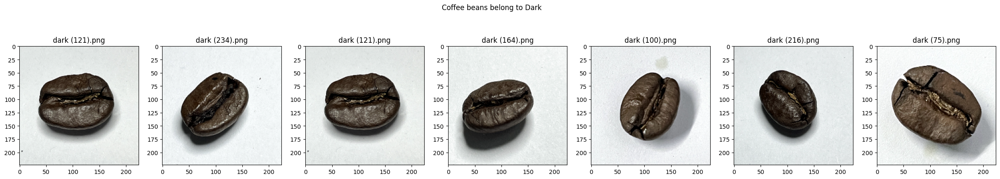

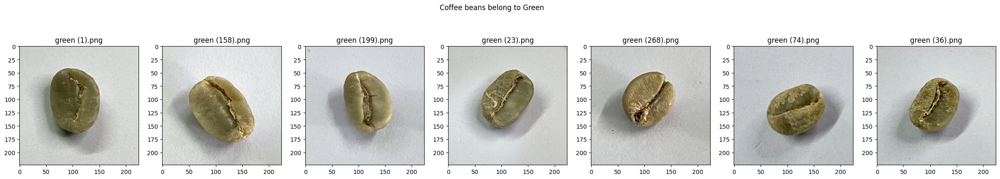

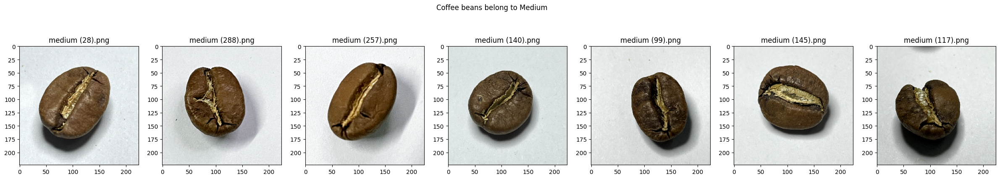

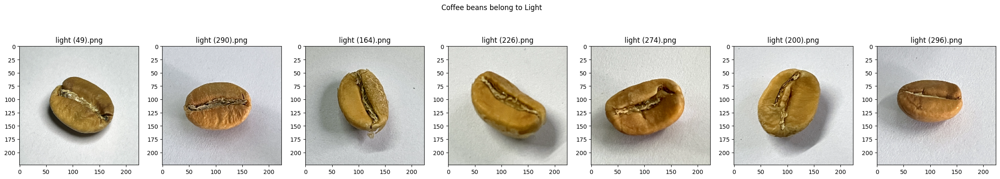

In [7]:
plot_sample_images(train_path, no_of_samples = 7, figsize = (30, 5))

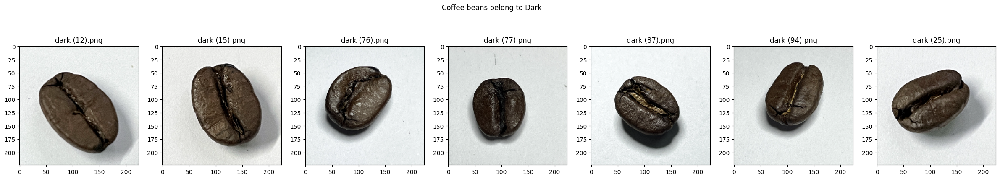

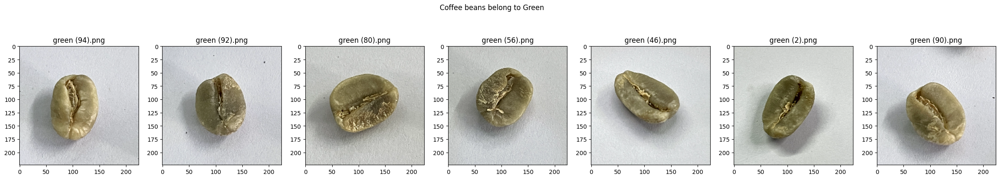

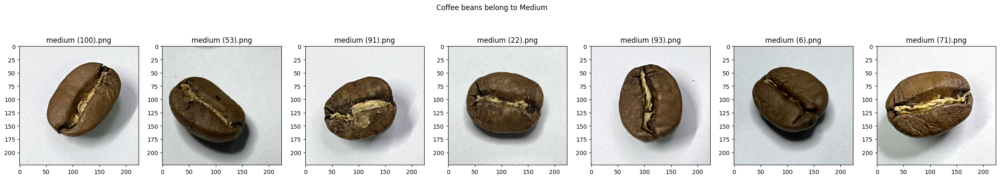

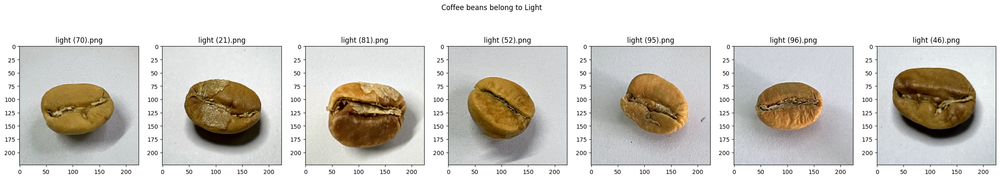

In [8]:
# plot test random sample
plot_sample_images(test_path, no_of_samples = 7, figsize = (30, 5))

**Checking dimension**

In [9]:
def check_dimension(folder_path):

    # To save the dimesions of all images
    dim1 = []
    dim2 = []

    for folder_name in os.listdir(folder_path):
        for image in os.listdir(folder_path + '/' + folder_name):

            # Reading each image from the path
            img = plt.imread(folder_path + '/' + folder_name + '/' + image)

            # Getting the dimensions of each image and storing them in lists
            d1, d2, _ = img.shape

            dim1.append(d1)
            dim2.append(d2)

    sns.jointplot(x = dim1, y = dim2)

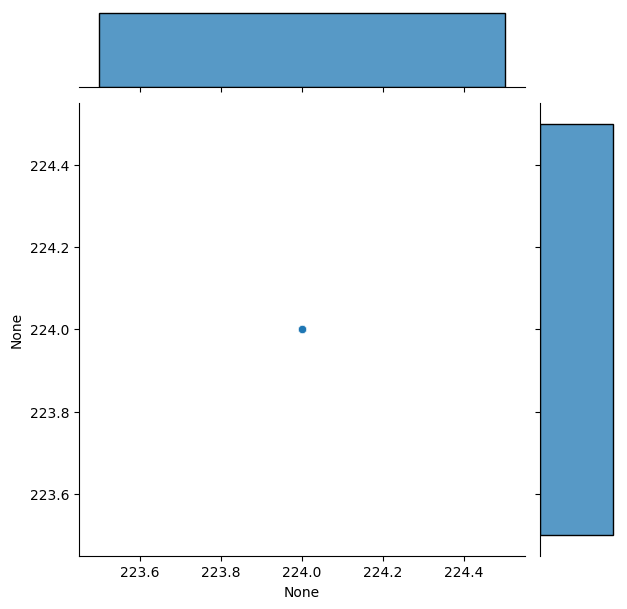

In [10]:
check_dimension(train_path)

Terlihat bahwa ukuran gambar adalah (224,224) dan kita akan memakai rgb

# iv. Exploratory Data Analysis (EDA)

**Make dataset based on directory**

In [11]:
# Dataframe Train
def train_df(tr_path):
    classes = []
    class_paths = []
    files = os.listdir(tr_path)
    for file in files:
        label_dir = os.path.join(tr_path, file)
        label = os.listdir(label_dir)
        for image in label:
            image_path = os.path.join(label_dir, image)
            class_paths.append(image_path)
            classes.append(file)
    image_classes = pd.Series(classes, name='Class')
    image_paths = pd.Series(class_paths, name='Class Path')
    tr_df = pd.concat([image_paths, image_classes], axis=1)
    return tr_df

In [12]:
# Dataframe Test
def test_df(ts_path):
    classes = []
    class_paths = []
    files = os.listdir(ts_path)
    for file in files:
        label_dir = os.path.join(ts_path, file)
        label = os.listdir(label_dir)
        for image in label:
            image_path = os.path.join(label_dir, image)
            class_paths.append(image_path)
            classes.append(file)
    image_classes = pd.Series(classes, name='Class')
    image_paths = pd.Series(class_paths, name='Class Path')
    ts_df = pd.concat([image_paths, image_classes], axis=1)
    return ts_df

In [13]:
# Train set and label
tr_df = train_df('/content/train')
tr_df

,Class Path,Class
0,/content/train/Dark/dark (21).png,Dark
1,/content/train/Dark/dark (290).png,Dark
2,/content/train/Dark/dark (202).png,Dark
3,/content/train/Dark/dark (239).png,Dark
4,/content/train/Dark/dark (269).png,Dark
...,...,...
1195,/content/train/Light/light (57).png,Light
1196,/content/train/Light/light (74).png,Light
1197,/content/train/Light/light (253).png,Light
1198,/content/train/Light/light (217).png,Light


In [14]:
# Test set and label
ts_df = test_df('/content/test')
ts_df

,Class Path,Class
0,/content/test/Dark/dark (21).png,Dark
1,/content/test/Dark/dark (31).png,Dark
2,/content/test/Dark/dark (18).png,Dark
3,/content/test/Dark/dark (15).png,Dark
4,/content/test/Dark/dark (61).png,Dark
...,...,...
395,/content/test/Light/light (93).png,Light
396,/content/test/Light/light (3).png,Light
397,/content/test/Light/light (20).png,Light
398,/content/test/Light/light (57).png,Light


## Analizing our Dataset

**Checking Class**

In [ ]:
# Chacking Train data
fig = px.bar(tr_df, x='Class', title='Count of images in each class')

# Customize the layout
fig.update_layout(
    xaxis_title='',  # Removing x-axis label
    yaxis_title='',  # Removing y-axis label
    title_font_size=20,
    width=800,
    height=600
)

# Adding annotations for counts
fig.update_traces(
    texttemplate='%{x}',
    textposition='outside'
)

# Show the plot
fig.show()

Penjelasan

Di Dataset memiliki jumlah kelas yang sama (balanced). selanjutnya cek test


In [ ]:
# Chacking Test-set
fig = px.bar(ts_df, x='Class', title='Count of images in each class')

# Customize the layout
fig.update_layout(
    xaxis_title='',  # Removing x-axis label
    yaxis_title='',  # Removing y-axis label
    title_font_size=20,
    width=800,
    height=600
)

# Adding annotations for counts
fig.update_traces(
    texttemplate='%{x}',
    textposition='outside'
)

# Show the plot
fig.show()

Penjelasan :

Sama halnya dengan Dataset test memiliki jumlah kelas yang seimbang

In [21]:
tr_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1200 entries, 0 to 1199
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Class Path  1200 non-null   object
 1   Class       1200 non-null   object
dtypes: object(2)
memory usage: 18.9+ KB


In [22]:
ts_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Class Path  400 non-null    object
 1   Class       400 non-null    object
dtypes: object(2)
memory usage: 6.4+ KB


In [23]:
tr_df.describe(include=['object'])

,Class Path,Class
count,1200,1200
unique,1200,4
top,/content/train/Dark/dark (21).png,Dark
freq,1,300


In [24]:
ts_df.describe(include=['object'])

,Class Path,Class
count,400,400
unique,400,4
top,/content/test/Dark/dark (21).png,Dark
freq,1,100


Conlusion

Data yang akan digunakan terdiri dari folder train dan folder test dengan empat kelas: "Dark", "Medium", "Light", dan "Green", yang masing-masing kelas memiliki jumlah data yang seimbang. Ukuran gambar adalah (224, 224, 3) dalam format RGB. Setiap kelas memiliki 300 gambar dalam folder train, dan folder test memiliki 100 gambar. Kelas median adalah "Medium".

---



# v. Feature Engineering

Context Gambar yang kita akan training sebagai berikut:
- memiliki ukuran (224,224)
- batch size adalah 32
- gambar mungkin harus di pertajam dalam pewarnaan




In [ ]:
# Define Image generator
imgen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale = 1./ 255,
    validation_split=0.2)

**Train-set**

In [ ]:
train = imgen.flow_from_directory(train_path,
                                  target_size=(224,224),
                                  batch_size=32,
                                  subset='training',
                                  class_mode='categorical',
                                  seed=2)

Found 960 images belonging to 4 classes.


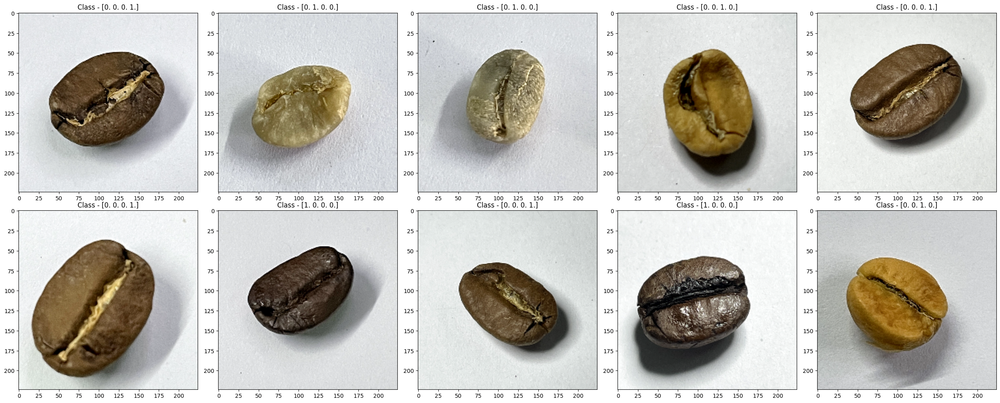

In [ ]:
# Show images of train-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))
n = 0

for i in range(2):
    for j in range(5):
        # Asumsi gambar berada di indeks [0] dan label di indeks [1]
        img = train[0][0][n]

        # Jika gambar dalam rentang [0, 1], skalakan ke [0, 255]
        if img.max() <= 1.0:
            img = (img * 255).astype('uint8')
        else:
            img = img.astype('uint8')

        # Menampilkan gambar
        ax[i][j].imshow(img)
        ax[i][j].set_title('Class - ' + str(train[0][1][n]))
        n += 1

plt.tight_layout()
plt.show()

**Validation-set**

In [ ]:
valid = imgen.flow_from_directory(train_path,
                                  target_size=(224,224),
                                  batch_size=32,
                                  subset='validation',
                                  class_mode='categorical',
                                  seed=2)

Found 240 images belonging to 4 classes.


In [ ]:
# Show images of train-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))
n = 0

for i in range(2):
    for j in range(5):
        # Asumsi gambar berada di indeks [0] dan label di indeks [1]
        img = valid[0][0][n]

        # Jika gambar dalam rentang [0, 1], skalakan ke [0, 255]
        if img.max() <= 1.0:
            img = (img * 255).astype('uint8')
        else:
            img = img.astype('uint8')

        # Menampilkan gambar
        ax[i][j].imshow(img)
        ax[i][j].set_title('Class - ' + str(valid[0][1][n]))
        n += 1

plt.tight_layout()
plt.show()

**Test-set**

In [ ]:
imgen_test = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./ 255,)
test = imgen_test.flow_from_directory(test_path,
                                  target_size=(224,224),
                                  class_mode='categorical',
                                  batch_size=32,
                                  shuffle=False,
                                  seed=2)

Found 400 images belonging to 4 classes.


In [ ]:
# Show images of Validation set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))
n = 0

for i in range(2):
    for j in range(5):
        # Asumsi gambar berada di indeks [0] dan label di indeks [1]
        img = test[0][0][n]

        # Jika gambar dalam rentang [0, 1], skalakan ke [0, 255]
        if img.max() <= 1.0:
            img = (img * 255).astype('uint8')
        else:
            img = img.astype('uint8')

        # Menampilkan gambar
        ax[i][j].imshow(img)
        ax[i][j].set_title('Class - ' + str(test[0][1][n]))
        n += 1

plt.tight_layout()
plt.show()

In [ ]:
# Create name class
data_dir = pathlib.Path("/content/train")
class_names = np.array(sorted([item.name for item in data_dir.glob("*")])) # creating a list of class names from subdirectory
print(class_names)

['Dark' 'Green' 'Light' 'Medium']


In [ ]:
# Cheking class
print('Train class - ',train.class_indices)
print('Test class - ',test.class_indices )

Train class -  {'Dark': 0, 'Green': 1, 'Light': 2, 'Medium': 3}
Test class -  {'Dark': 0, 'Green': 1, 'Light': 2, 'Medium': 3}


---

# vi. ANN Training (Sequential API/Functional API)

Quick description, before heading on:

Model type: Sequential

Layers used:

0. InputLayer (224,224, 3) 'rgb'
1. Conv2D (32 filters, kernal = (3,3), activation='relu)
2. MaxPool2D
3. Conv2D (64 filters, kernel = (3,3), activation='relu)
4. MaxPool2D
5. Conv2D (64 filters, kernel = (3,3), activation='relu)
6. MaxPool2D
7. Flatten
8. Dropout
9. Dense

**Semakin besar ukuran gambar dan semakin kompleks tugasnya, semakin banyak lapisan konv yang harus kita tambahkan.**

alasan menggunakan ReLU (Rectified Linear Unit) dalam model Anda:
- sederhana
- Mengatasi Masalah Vanishing Gradient
- Konvergensi Lebih Cepat

## vi.1. Model Definition

In [ ]:
# Clear Session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

# define model Sequential
base_model = Sequential()

base_model.add(tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3),activation='relu', input_shape=(224, 224, 3))) # input and conv task
base_model.add(tf.keras.layers.MaxPooling2D(2, 2))

base_model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
base_model.add(tf.keras.layers.MaxPooling2D(2, 2))

base_model.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3),activation='relu'))
base_model.add(tf.keras.layers.MaxPooling2D(2, 2))

base_model.add(Flatten())

base_model.add(tf.keras.layers.Dense(512, activation='relu'))
base_model.add(tf.keras.layers.Dropout(0.5))

base_model.add(tf.keras.layers.Dense(4, activation='softmax'))



base_model.compile(loss = 'categorical_crossentropy',
              optimizer = 'adam',
              metrics = ['accuracy'])

base_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 64)        0

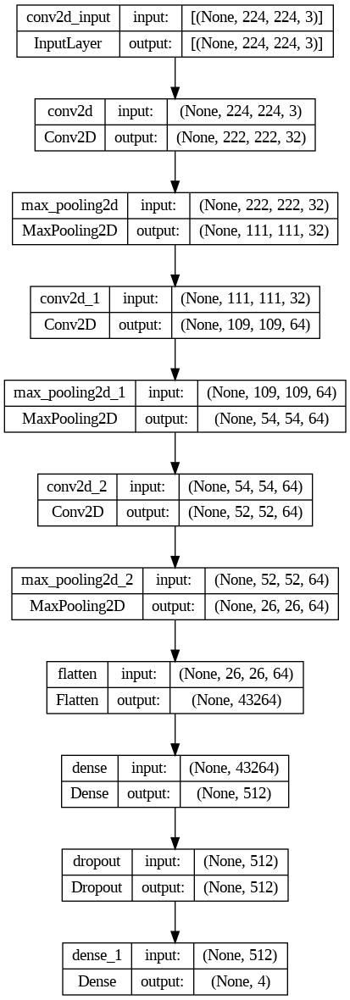

In [ ]:
# Plot Layers

tf.keras.utils.plot_model(base_model, show_shapes=True)

## vi.2. Model Training

In [ ]:
history = base_model.fit(train, epochs = 25, steps_per_epoch = len(train),
                    validation_data = valid, validation_steps = int(0.25 * len(valid)))

Epoch 1/25
30/30 [==============================] - 103s 3s/step - loss: 1.4768 - accuracy: 0.4573 - val_loss: 0.8503 - val_accuracy: 0.5938
Epoch 2/25
30/30 [==============================] - 97s 3s/step - loss: 0.3416 - accuracy: 0.8729 - val_loss: 0.1711 - val_accuracy: 0.9219
Epoch 3/25
30/30 [==============================] - 109s 4s/step - loss: 0.1439 - accuracy: 0.9469 - val_loss: 0.1122 - val_accuracy: 0.9688
Epoch 4/25
30/30 [==============================] - 102s 3s/step - loss: 0.0800 - accuracy: 0.9719 - val_loss: 0.1993 - val_accuracy: 0.9219
Epoch 5/25
30/30 [==============================] - 98s 3s/step - loss: 0.1312 - accuracy: 0.9490 - val_loss: 0.1535 - val_accuracy: 0.9375
Epoch 6/25
30/30 [==============================] - 105s 4s/step - loss: 0.0519 - accuracy: 0.9833 - val_loss: 0.1622 - val_accuracy: 0.9219
Epoch 7/25
30/30 [==============================] - 98s 3s/step - loss: 0.0434 - accuracy: 0.9844 - val_loss: 0.0551 - val_accuracy: 0.9844
Epoch 8/25
30/30

In [ ]:
base_model.save('baseModel_coffee_beans_classifier.h5')
# save to drive
base_model.save('/content/drive/MyDrive/Graded_Challange7/baseModel_coffee_beans_classifier.h5')

## vi.3. Model Evaluation

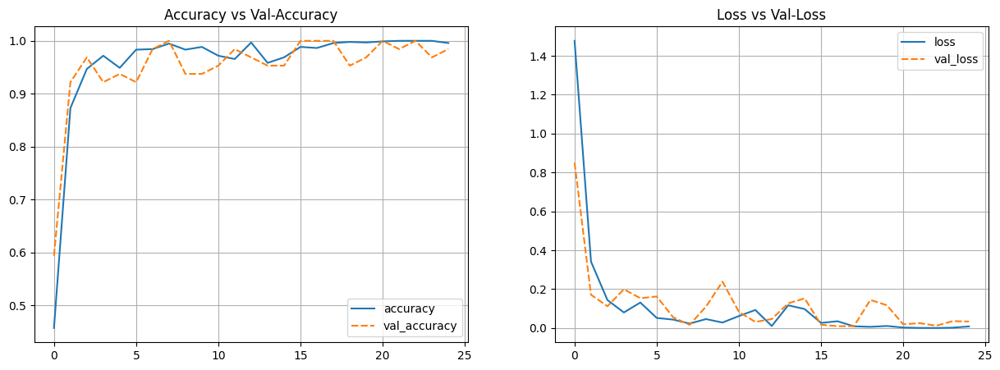

In [ ]:
# Plot Training Results

history_model_1 = pd.DataFrame(history.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_model_1[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_model_1[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')
plt.show()

Seperti yang bisa kita lihat,loss-nya konstan (naik-turun) dan di lihat dari accuracy cenderung overfitting walaupun tidak jauh. dan hasil 100% ini bisa indikasi bahwa overfitting. kita bisa callbacks di epoch ke 10.

**Evaluate model**

In [ ]:
results = base_model.evaluate(test, verbose=1)

13/13 [==============================] - 12s 921ms/step - loss: 0.0072 - accuracy: 0.9975


In [ ]:
print('Loss',results[0])
print('accuracy', results[1])

Loss 0.0072191935032606125
accuracy 0.9975000023841858


Overall kita mendapatkan 0.99 untuk accuracy dan 0.07 untuk loss. Selanjutnya kita akan coba predicting

In [ ]:
pred = base_model.predict(test) # gives probabilites
predictions = np.argmax(pred, axis = -1)

13/13 [==============================] - 12s 934ms/step


In [ ]:
print(pred[0])

[9.9999994e-01 0.0000000e+00 0.0000000e+00 1.5867804e-13]


**Classification report**

In [ ]:
print(classification_report(test.classes, predictions, target_names = list(train.class_indices)))

              precision    recall  f1-score   support

        Dark       0.99      1.00      1.00       100
       Green       1.00      1.00      1.00       100
       Light       1.00      1.00      1.00       100
      Medium       1.00      0.99      0.99       100

    accuracy                           1.00       400
   macro avg       1.00      1.00      1.00       400
weighted avg       1.00      1.00      1.00       400



dilihat dari classification report model overall cenderung memprediksi green dan light bisa di buktikan dengan green 100%, dan light 100%

**Confusion matrix**

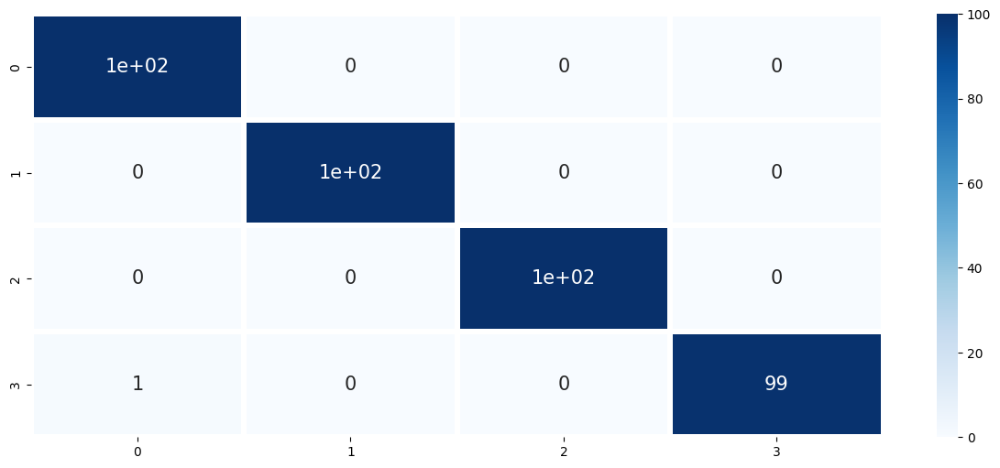

In [ ]:
fig = plt.figure(figsize = (15,6))
sns.heatmap(confusion_matrix(test.classes, predictions), annot = True, linewidths = 3, annot_kws={'size': 15}, cmap='Blues')

plt.show()

**Try Predicting**

In [ ]:
def prediction(file):
  img = tf.keras.utils.load_img(file, target_size=(224, 224))
  x = tf.keras.utils.img_to_array(img)/255

  imgs = np.expand_dims(img, axis=0)

  images = np.vstack([imgs])
  classes = base_model.predict(images, batch_size=32)
  idx = np.argmax(classes)
  labels = ['Dark', 'Green', 'Light', 'Medium']
  print('Prediction is a {}'.format(labels[idx]))

  plt.imshow(img)
  plt.title(f"Prediction: {labels[idx]}")
  plt.axis(False);
  print('Proba predict')
  print(classes)

1/1 [==============================] - 0s 239ms/step
Prediction is a Light
Proba predict
[[0. 0. 1. 0.]]


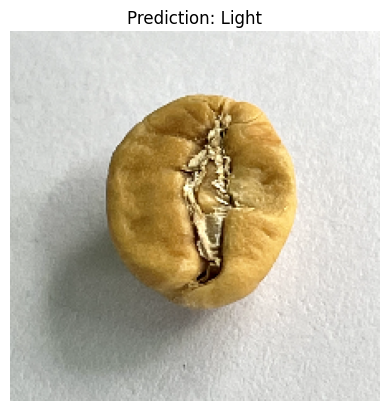

In [ ]:
prediction('/content/test/Light/light (100).png')

1/1 [==============================] - 0s 84ms/step
Prediction is a Dark
Proba predict
[[1. 0. 0. 0.]]


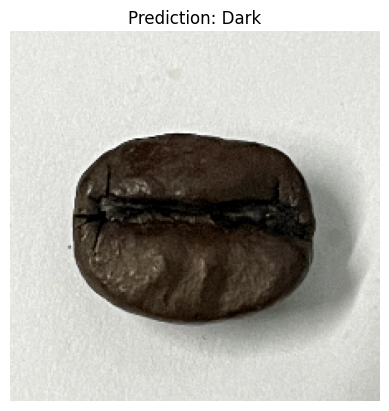

In [ ]:
prediction('/content/test/Dark/dark (27).png')

In [ ]:
prediction('/content/test/Green/green (4).png')

In [ ]:
prediction('/content/test/Dark/dark (15).png')

In [ ]:
!wget -q https://i.pinimg.com/564x/75/16/e3/7516e3c6cb6038c98971e78d7b6a2a27.jpg

1/1 [==============================] - 0s 120ms/step
Prediction is a Green
Proba predict
[[0. 1. 0. 0.]]


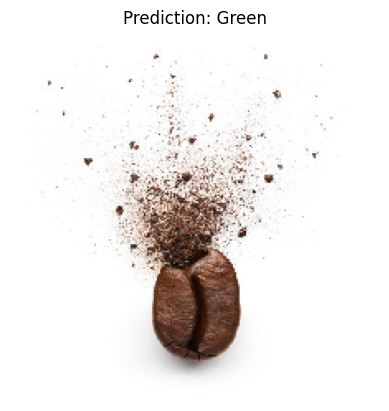

In [ ]:
prediction('/content/7516e3c6cb6038c98971e78d7b6a2a27.jpg')


Conclusions

Model kita menunjukkan kinerja yang cukup baik, meskipun terdapat sedikit overfitting. Hasil keseluruhan klasifikasi berada dalam kisaran 90 ke atas. Secara keseluruhan, akurasi model mencapai 99% dengan nilai loss sebesar 0.07. Dalam melakukan prediksi, model ini belum cukup general.  Oleh karena itu, kita harus melakukan penyesuaian dalam feature enginering (augmentasi) atau menggunakan transfer learning.


---

# vii. ANN Improvement (Sequential API/Functional API)

In [ ]:
train_path = '/content/train'
test_path = '/content/test'

**Augmentasi**

Teknik augmentasi gambar untuk meningkatkan kinerja model klasifikasi gambar yang saya pakai sebagai berikut:

- Rescale: Menormalisasi nilai piksel gambar.
- Horizontal Flip: Membalik gambar secara horizontal.
- Rotation: Memutar gambar hingga 20 derajat.
- Width Shift: Menggeser gambar secara horizontal.
- Height Shift: Menggeser gambar secara vertikal.
- Shear: Mendistorsi gambar.
- Zoom: Memperbesar atau memperkecil gambar.
- Brightness: Mengubah kecerahan gambar.
- Fill Mode: Mengisi area kosong dengan nilai piksel terdekat.
- Validation Split: Membagi data menjadi 80% untuk pelatihan dan 20% untuk validasi.
Augmentasi ini membuat model lebih kuat dan mampu mengenali gambar dalam berbagai kondisi

In [ ]:
# define images genarator

imgen2 = ImageDataGenerator(
    rescale = 1./ 255,
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range = 0.1,
    brightness_range=[0.9, 1.0],
    fill_mode = 'nearest',
    validation_split=0.2)

**Spliting data image with augmentasi**

In [ ]:
# Train
train_set = imgen2.flow_from_directory(train_path,
                                  target_size=(224,224),
                                  color_mode='rgb',
                                  batch_size=32,
                                  subset='training',
                                  class_mode='categorical',

                                  seed=2)

# validation
valid_set = imgen2.flow_from_directory(train_path,
                                  target_size=(224,224),
                                  color_mode='rgb',
                                  batch_size=32,
                                  subset='validation',
                                  class_mode='categorical',
                                  seed=2)


# test
imgen_test = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_set = imgen_test.flow_from_directory(test_path,
                                  target_size=(224,224),
                                  class_mode='categorical',
                                  color_mode='rgb',
                                  batch_size=32,
                                  shuffle=False,
                                  seed=2)


Found 960 images belonging to 4 classes.
Found 240 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


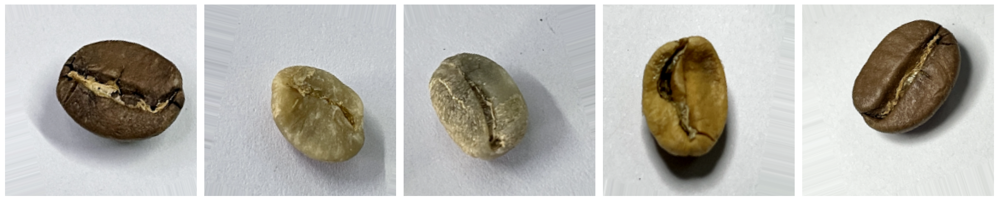

In [ ]:
# Mendapatkan batch gambar dan label
images, labels = next(train_set)

# Menampilkan beberapa gambar dari batch
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
axes = axes.flatten()
for img, ax in zip(images, axes):
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()

## vii.1. Model Definition

Dalam hal ini saya menggunakan Transfer learning untuk improvement

- Penggunaan Transfer Learning: Saya menggunakan VGG16 yang telah dilatih sebelumnya sebagai dasar. Ini memungkinkan model untuk memanfaatkan fitur-fitur kompleks yang telah dipelajari dari dataset ImageNet, sehingga meningkatkan kinerja dan efisiensi pelatihan.

- Freezing Layers: Dengan membekukan lapisan bawah dari VGG16, Saya menjaga bobot yang telah dipelajari tetap tidak berubah, yang mengurangi risiko overfitting dan mempercepat pelatihan.

- Dropout Layer: Penambahan lapisan Dropout membantu dalam mencegah overfitting dengan secara acak mengabaikan sejumlah unit selama pelatihan.

- Output Layer: Lapisan Dense dengan aktivasi softmax menghasilkan probabilitas untuk setiap dari 4 kelas target, cocok untuk masalah klasifikasi multiklas.

- Optimisasi dan Loss Function: Penggunaan optimizer adam dan loss function categorical_crossentropy adalah standar untuk masalah klasifikasi dan memastikan konvergensi yang baik.

In [ ]:
# Clear Session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)


# Download the Model
pretrained_model = tf.keras.applications.VGG16(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)
)

# Freeze the Lower Layers
pretrained_model.trainable = False

# Define model sequential
model2 = Sequential()

# Add pretrained model
model2.add(pretrained_model)

model2.add(Flatten())
model2.add(Dropout(0.5))

# Add output layer
model2.add(Dense(4, activation='softmax'))


# Compile the model
model2.compile(
    optimizer = 'adam',
    loss='categorical_crossentropy',
    metrics=['accuracy'])

# Print model2 summary
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dropout (Dropout)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 4)                 100356    
                                                                 
Total params: 14815044 (56.51 MB)
Trainable params: 100356 (392.02 KB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


## vii.2. Model Training

In [ ]:
# callbacks

# Checkpoint callback
checkpoint_cb = ModelCheckpoint("best_model.h5", save_best_only=True)

# Early stopping callback
early_stopping_cb = EarlyStopping(monitor='val_loss',
                                  patience=3,
                                  mode='min')


hist = model.fit(train_set, epochs = 20,
                 validation_data = valid_set,
                 validation_steps = int(0.25*len(valid_set)),
                 callbacks=[early_stopping_cb,checkpoint_cb])

Epoch 1/20
30/30 [==============================] - 219s 7s/step - loss: 2.7292 - accuracy: 0.2771 - val_loss: 1.2232 - val_accuracy: 0.2969
Epoch 2/20
30/30 [==============================] - 209s 7s/step - loss: 2.0327 - accuracy: 0.3750 - val_loss: 1.1112 - val_accuracy: 0.4688
Epoch 3/20
30/30 [==============================] - 203s 7s/step - loss: 1.5757 - accuracy: 0.4177 - val_loss: 0.8491 - val_accuracy: 0.6094
Epoch 4/20
30/30 [==============================] - 205s 7s/step - loss: 1.3297 - accuracy: 0.4354 - val_loss: 0.8549 - val_accuracy: 0.5625
Epoch 5/20
30/30 [==============================] - 207s 7s/step - loss: 1.2098 - accuracy: 0.4854 - val_loss: 0.9033 - val_accuracy: 0.5000
Epoch 6/20
30/30 [==============================] - 211s 7s/step - loss: 1.0677 - accuracy: 0.5396 - val_loss: 0.7612 - val_accuracy: 0.7344
Epoch 7/20
30/30 [==============================] - 203s 7s/step - loss: 0.9518 - accuracy: 0.5573 - val_loss: 0.8479 - val_accuracy: 0.5625
Epoch 8/20
30

Dari hasil model kurang baik jadi mari mencoba yang lain

## vii.3. Model Evaluation

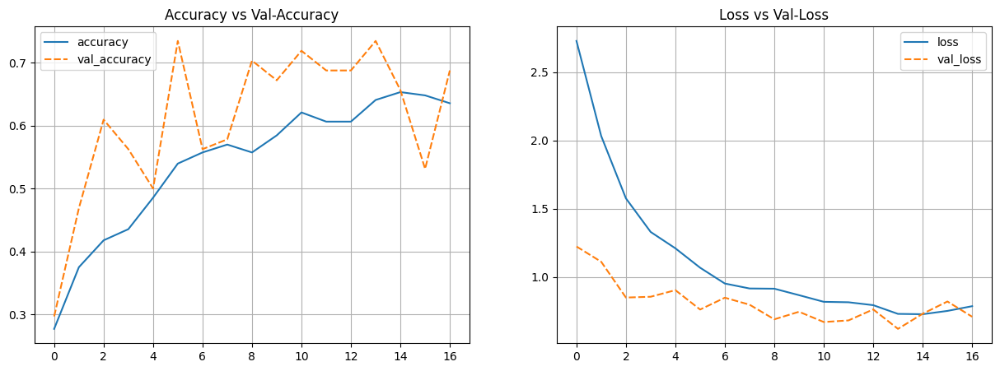

In [ ]:
# Plot Training Results

history_model_1 = pd.DataFrame(hist.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_model_1[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_model_1[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')
plt.show()

Dari hasil visualisasi model accuracy tidak bagus di bawah kisaran 70% kebawah dan loss cukup kecil di kisaran 0 - 1. namun model masih belum yang kita inginkan

**Evaluate model**

In [ ]:
# Evaluasi model
results2 = model.evaluate(test_set, verbose=1)
results2

13/13 [==============================] - 74s 6s/step - loss: 0.9825 - accuracy: 0.5975


[0.9824619889259338, 0.5975000262260437]

In [ ]:
print('Loss - ',results2[0])
print('Accuracy - ', results2[1])

Loss -  0.9824619889259338
Accuracy -  0.5975000262260437


Bisa dilihat model jelek. jadi saya coba memakai base model yang di augmentasi dan callback

In [ ]:
pred2 = model.predict(test_set) # gives probabilites
predictions2 = np.argmax(pred2, axis = -1)

13/13 [==============================] - 77s 6s/step


In [ ]:
print(pred2)

[[9.9696970e-01 1.2561255e-09 1.2248424e-07 3.0301053e-03]
 [9.6879762e-01 9.5203194e-07 4.5763107e-05 3.1155704e-02]
 [9.9388260e-01 8.0322909e-10 1.8383908e-07 6.1171064e-03]
 ...
 [8.1591862e-01 6.4352891e-05 1.1260508e-03 1.8289088e-01]
 [8.8380837e-01 3.0847925e-05 1.1860800e-03 1.1497462e-01]
 [7.6336992e-01 1.5977832e-05 3.1578473e-03 2.3345621e-01]]


**Classification report**

In [ ]:
print(classification_report(test_set.classes, predictions, target_names = list(train_set.class_indices)))

              precision    recall  f1-score   support

        Dark       0.49      1.00      0.66       100
       Green       0.88      0.64      0.74       100
       Light       0.67      0.72      0.69       100
      Medium       0.21      0.03      0.05       100

    accuracy                           0.60       400
   macro avg       0.56      0.60      0.54       400
weighted avg       0.56      0.60      0.54       400



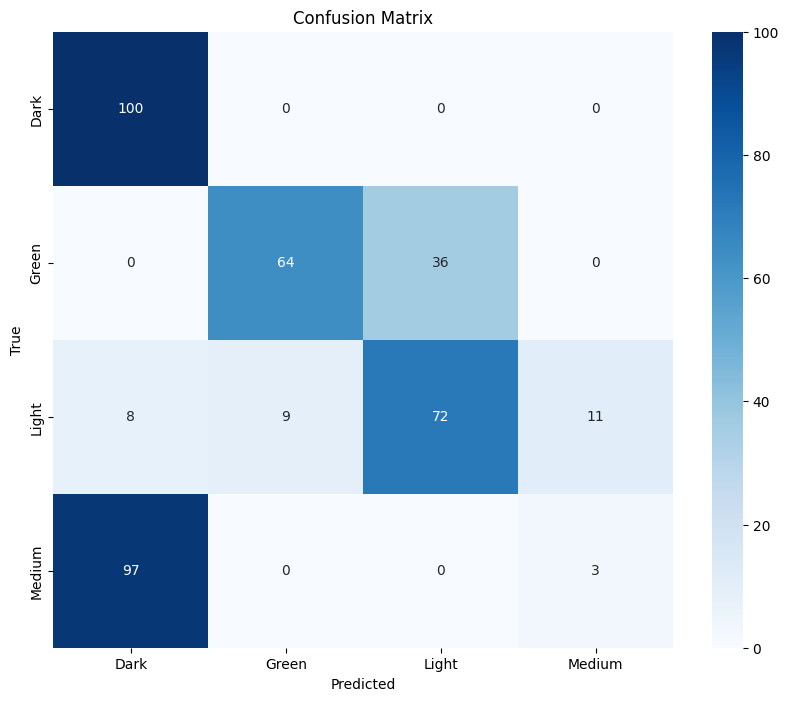

In [ ]:
# Kelas sebenarnya dari generator
true_classes = test_set.classes
class_labels = list(test_set.class_indices.keys())

# Buat confusion matrix
cm = confusion_matrix(true_classes, predictions2)

# Plot confusion matrix sebagai heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

**Try Predicting**

In [ ]:
def prediction(file):
  img = tf.keras.utils.load_img(file, target_size=(224, 224))
  x = tf.keras.utils.img_to_array(img)/255

  imgs = np.expand_dims(img, axis=0)

  images = np.vstack([imgs])
  classes = model.predict(images, batch_size=32)
  idx = np.argmax(classes)
  labels = ['Dark', 'Green', 'Light', 'Medium']
  print('Prediction is a {}'.format(labels[idx]))

  plt.imshow(img)
  plt.title(f"Prediction: {labels[idx]}")
  plt.axis(False);
  print('Proba predict')
  print(classes)

1/1 [==============================] - 0s 186ms/step
Prediction is a Dark
Proba predict
[[1.0000000e+00 0.0000000e+00 0.0000000e+00 8.8966046e-21]]


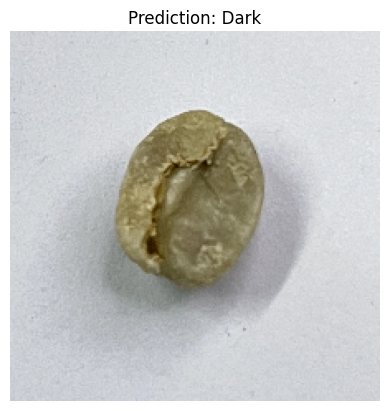

In [ ]:
prediction('/content/test/Green/green (16).png')

In [ ]:
!wget -q https://i.pinimg.com/564x/75/16/e3/7516e3c6cb6038c98971e78d7b6a2a27.jpg

In [ ]:
prediction('/content/7516e3c6cb6038c98971e78d7b6a2a27.jpg')

Model canderung tidak genarelisasi sehingga saya pikir lebih baik menggunakan base_model dengan augmentasi.

In [ ]:
model.save('model_cacat.h5')
# save to drive
model.save('/content/drive/MyDrive/Graded_Challange7/model_cacat.h5')

---

# **New Model Adjustment**

In [ ]:
trainPath = '/content/train'
testPath = '/content/test'

> Menggunkan train_set, valid_set, dan test_set yang sudah di augmetasi





In [ ]:
# define images genarator

imgen3 = ImageDataGenerator(
    rescale = 1./ 255,
    horizontal_flip=True,
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.1,
    zoom_range = 0.1,
    fill_mode = 'nearest',
    validation_split=0.2)

In [ ]:
# Train
train_d = imgen3.flow_from_directory(trainPath,
                                  target_size=(224,224),
                                  batch_size=32,
                                  subset='training',
                                  class_mode='categorical',
                                  shuffle=True,
                                  seed=2)

# validation
valid_d = imgen3.flow_from_directory(trainPath,
                                  target_size=(224,224),
                                  batch_size=32,
                                  subset='validation',
                                  shuffle=True,
                                  class_mode='categorical',
                                  seed=2)


# test
imgen_test = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./ 255,)
test_d = imgen_test.flow_from_directory(testPath,
                                  target_size=(224,224),
                                  class_mode='categorical',
                                  batch_size=32,
                                  shuffle=False,
                                  seed=2)

Found 960 images belonging to 4 classes.
Found 240 images belonging to 4 classes.
Found 400 images belonging to 4 classes.


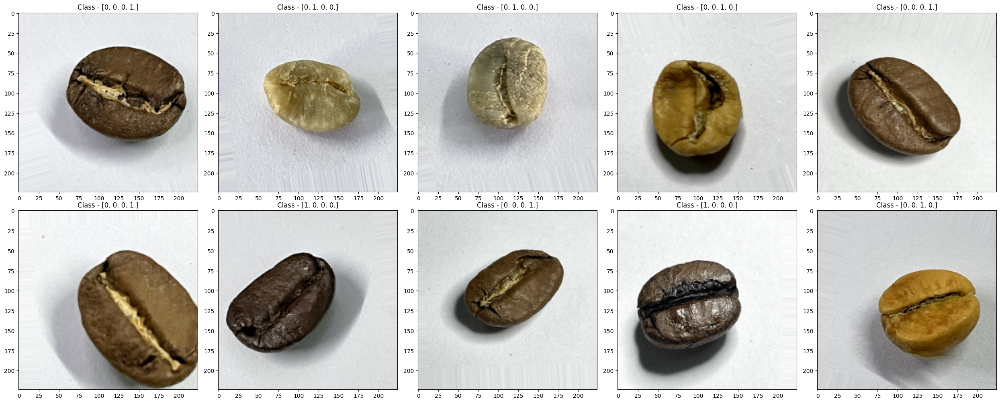

In [ ]:
# Show images of train-set
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(25, 10))
n = 0

for i in range(2):
    for j in range(5):
        # Asumsi gambar berada di indeks [0] dan label di indeks [1]
        img = train_d[0][0][n]

        # Jika gambar dalam rentang [0, 1], skalakan ke [0, 255]
        if img.max() <= 1.0:
            img = (img * 255).astype('uint8')
        else:
            img = img.astype('uint8')

        # Menampilkan gambar
        ax[i][j].imshow(img)
        ax[i][j].set_title('Class - ' + str(train_d[0][1][n]))
        n += 1

plt.tight_layout()
plt.show()

## **Model Definition**

In [ ]:
# Clear Session
seed = 20
tf.keras.backend.clear_session()
np.random.seed(seed)
tf.random.set_seed(seed)

modelV2 = Sequential()

# The larger the image size and more complex the task, the more conv layers we should add.
modelV2.add(tf.keras.layers.Conv2D(filters=32, kernel_size=(3,3),activation='relu', input_shape=(224, 224, 3)))
modelV2.add(tf.keras.layers.MaxPooling2D(2, 2))

modelV2.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu'))
modelV2.add(tf.keras.layers.MaxPooling2D(2, 2))

modelV2.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3),activation='relu'))
modelV2.add(tf.keras.layers.MaxPooling2D(2, 2))

modelV2.add(Flatten())

modelV2.add(tf.keras.layers.Dense(512, activation='relu'))
modelV2.add(tf.keras.layers.Dropout(0.5))

modelV2.add(tf.keras.layers.Dense(4, activation='softmax'))



modelV2.compile(loss = 'categorical_crossentropy',
              optimizer = 'adam',
              metrics = ['accuracy'])

modelV2.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 26, 26, 64)        0

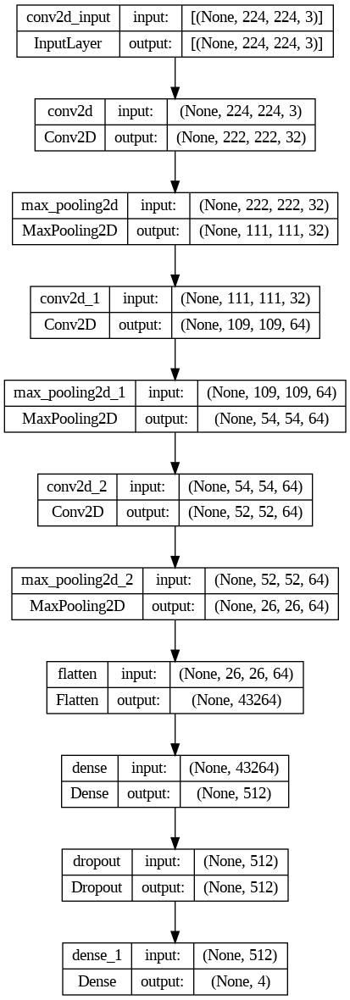

In [ ]:
# Show arcitecture
tf.keras.utils.plot_model(modelV2, show_shapes=True)

## **Model training**

alasan epoch 10 karena base model lebih baik di epoch tersebut bisa di buktikan di model evaluasi

In [ ]:
# Checkpoint callback
checkpoint_cb = ModelCheckpoint("best_model_genaral.h5", save_best_only=True)

# Early stopping callback
early_stopping_cb = EarlyStopping(monitor='val_loss',
                                  patience=3,
                                  mode='min')


results = modelV2.fit(train_d, epochs = 10,
                 validation_data = valid_d,
                 validation_steps = int(0.25*len(valid_d)),
                 callbacks=[early_stopping_cb,checkpoint_cb])

Epoch 1/10
30/30 [==============================] - 143s 5s/step - loss: 1.4709 - accuracy: 0.3479 - val_loss: 0.8886 - val_accuracy: 0.6094
Epoch 2/10
30/30 [==============================] - 112s 4s/step - loss: 0.7208 - accuracy: 0.6906 - val_loss: 0.3649 - val_accuracy: 0.8906
Epoch 3/10
30/30 [==============================] - 110s 4s/step - loss: 0.3005 - accuracy: 0.8875 - val_loss: 0.3149 - val_accuracy: 0.8281
Epoch 4/10
30/30 [==============================] - 112s 4s/step - loss: 0.1755 - accuracy: 0.9292 - val_loss: 0.1537 - val_accuracy: 0.9375
Epoch 5/10
30/30 [==============================] - 119s 4s/step - loss: 0.1274 - accuracy: 0.9615 - val_loss: 0.1384 - val_accuracy: 0.9375
Epoch 6/10
30/30 [==============================] - 115s 4s/step - loss: 0.1364 - accuracy: 0.9531 - val_loss: 0.0966 - val_accuracy: 0.9531
Epoch 7/10
30/30 [==============================] - 109s 4s/step - loss: 0.1000 - accuracy: 0.9635 - val_loss: 0.0602 - val_accuracy: 0.9688
Epoch 8/10
30

In [ ]:
# save to drive
modelV2.save('/content/drive/MyDrive/Graded_Challange7/best_model_genaral.h5')

## **Model evaluate**

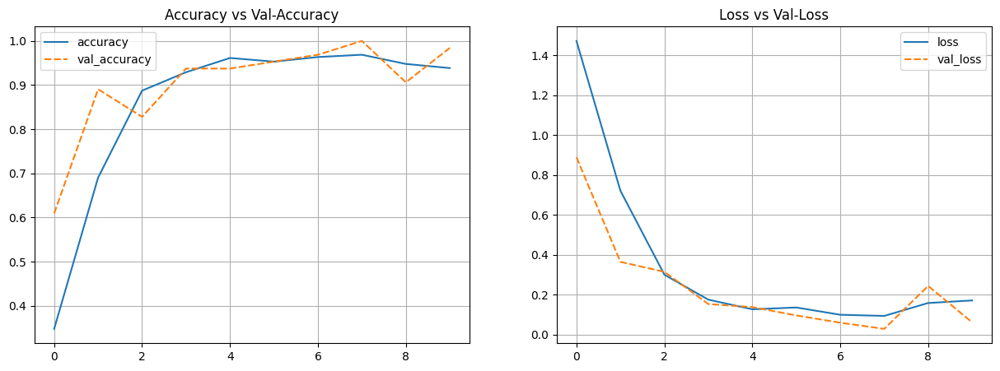

In [ ]:
# Plot Training Results

history_model_1 = pd.DataFrame(results.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_model_1[['accuracy', 'val_accuracy']])
plt.grid()
plt.title('Accuracy vs Val-Accuracy')

plt.subplot(1, 2, 2)
sns.lineplot(data=history_model_1[['loss', 'val_loss']])
plt.grid()
plt.title('Loss vs Val-Loss')
plt.show()

In [ ]:
# Evaluasi model
results2 = modelV2.evaluate(test_d, verbose=1)

13/13 [==============================] - 14s 1s/step - loss: 0.0915 - accuracy: 0.9775


In [ ]:
print('Loss - ',results2[0])
print('accuracy - ', results2[1])

Loss -  0.09151720255613327
accuracy -  0.9775000214576721


Overall kita mendapat 0.97 untuk accuracy sedangkan untuk loss 0.07

In [ ]:
pred = modelV2.predict(test_d) # gives probabilites
predictions3 = np.argmax(pred, axis = -1)

13/13 [==============================] - 13s 1s/step


In [ ]:
print(classification_report(test_d.classes, predictions3, target_names = list(train_d.class_indices)))

              precision    recall  f1-score   support

        Dark       0.94      0.99      0.97       100
       Green       1.00      1.00      1.00       100
       Light       1.00      0.98      0.99       100
      Medium       0.97      0.94      0.95       100

    accuracy                           0.98       400
   macro avg       0.98      0.98      0.98       400
weighted avg       0.98      0.98      0.98       400



Dilihat dari classifiaction report model cenderung memprediksi green. tapi model lebih baik di bandingkan sebelumnya

In [ ]:
print(pred)

[[9.9999994e-01 3.3493511e-38 0.0000000e+00 2.1111383e-10]
 [9.9984860e-01 2.0935805e-11 2.0882960e-15 1.5139059e-04]
 [9.9999994e-01 2.6992070e-30 2.3643887e-37 3.4609840e-10]
 ...
 [1.9428430e-02 1.8890967e-10 1.6311597e-08 9.8057151e-01]
 [1.4817875e-04 5.5898980e-10 8.7651279e-07 9.9985099e-01]
 [1.5143381e-02 6.3838279e-13 7.0922129e-11 9.8485661e-01]]


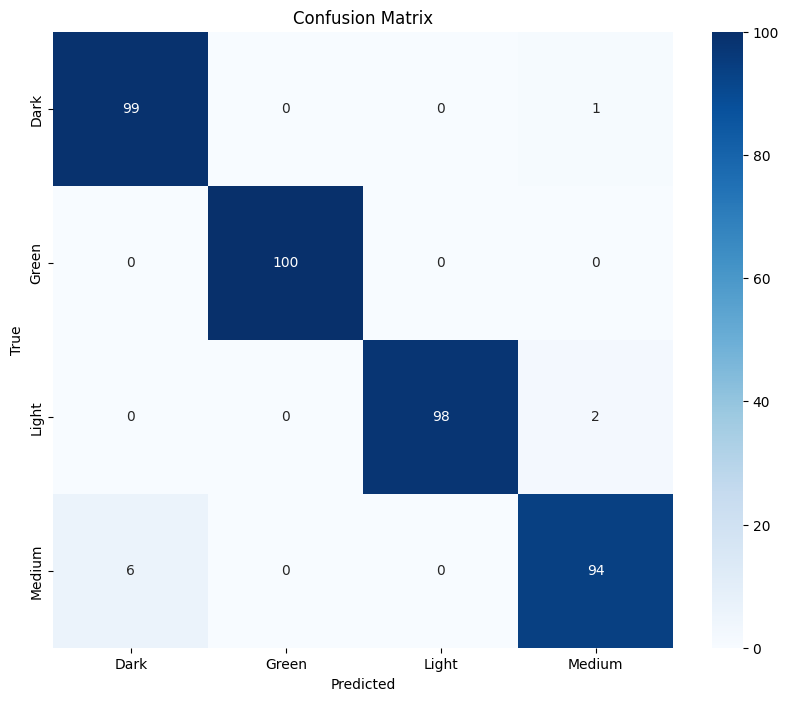

In [ ]:
# Kelas sebenarnya dari generator
true_classes = test_d.classes
class_labels = list(test_d.class_indices.keys())

# Buat confusion matrix
cm = confusion_matrix(true_classes, predictions3)

# Plot confusion matrix sebagai heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

**Try predicting**

In [ ]:
def prediction(file):
  img = tf.keras.utils.load_img(file, target_size=(224, 224))
  x = tf.keras.utils.img_to_array(img)/255

  imgs = np.expand_dims(img, axis=0)

  images = np.vstack([imgs])
  classes = modelV2.predict(images, batch_size=32)
  idx = np.argmax(classes)
  labels = ['Dark', 'Green', 'Light', 'Medium']
  print('Prediction is a {}'.format(labels[idx]))

  plt.imshow(img)
  plt.title(f"Prediction: {labels[idx]}")
  plt.axis(False);
  print('Proba predict')
  print(classes)

1/1 [==============================] - 0s 117ms/step
Prediction is a Dark
Proba predict
[[1. 0. 0. 0.]]


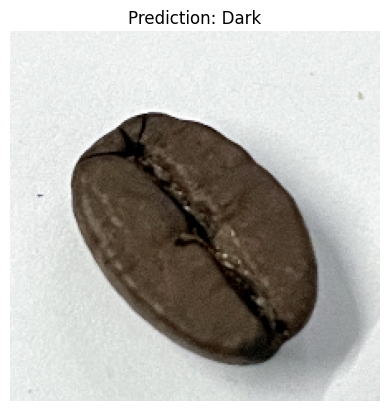

In [ ]:
prediction('/content/test/Dark/dark (12).png')

1/1 [==============================] - 0s 47ms/step
Prediction is a Light
Proba predict
[[0. 0. 1. 0.]]


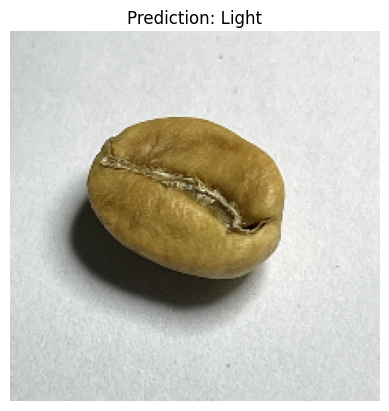

In [ ]:
prediction('/content/test/Light/light (15).png')

1/1 [==============================] - 0s 45ms/step
Prediction is a Green
Proba predict
[[0. 1. 0. 0.]]


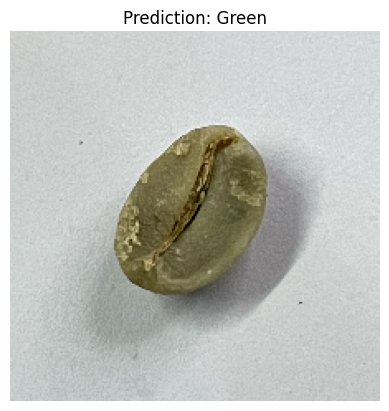

In [ ]:
prediction('/content/test/Green/green (15).png')

1/1 [==============================] - 0s 46ms/step
Prediction is a Medium
Proba predict
[[0. 0. 0. 1.]]


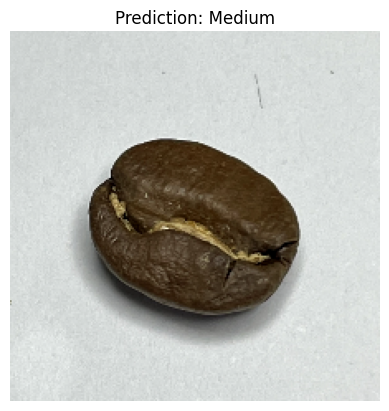

In [ ]:
prediction('/content/test/Medium/medium (28).png')

In [ ]:
!wget -q https://harazcoffeehouse.com/cdn/shop/products/DarkRoast_1f53d2c5-40bc-4c79-ad10-81f1a364cfcd_1024x1024.jpg?v=1703885511

1/1 [==============================] - 0s 76ms/step
Prediction is a Medium
Proba predict
[[0. 0. 0. 1.]]


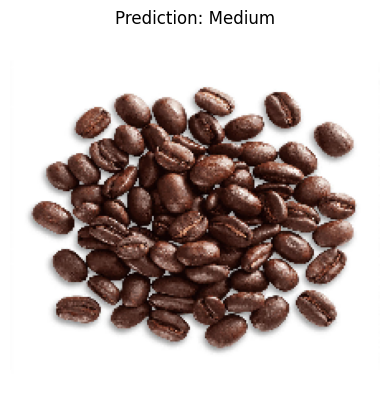

In [ ]:
prediction('/content/DarkRoast_1f53d2c5-40bc-4c79-ad10-81f1a364cfcd_1024x1024.jpg?v=1703885511')

In [ ]:
!wget -q https://5.imimg.com/data5/SELLER/Default/2023/2/CP/OM/EE/151094584/un-rosted-bean-500x500.jpg

1/1 [==============================] - 0s 125ms/step
Prediction is a Light
Proba predict
[[0. 0. 1. 0.]]


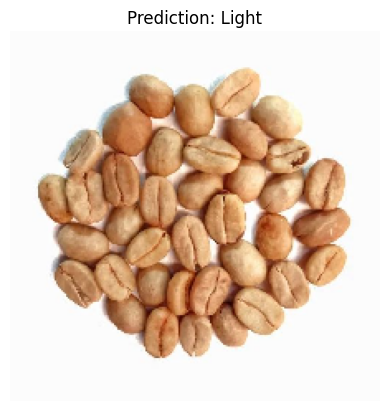

In [ ]:
prediction('/content/un-rosted-bean-500x500.jpg')

In [ ]:
!wget -q https://5.imimg.com/data5/SELLER/Default/2023/6/314355358/WX/MP/KJ/18856673/raw-coffee-beans.png

In [ ]:
prediction('/content/raw-coffee-beans.png')

# viii.Model Saving

In [ ]:
base_model.save('/content/drive/MyDrive/Graded_Challange7/baseModel_coffee_beans.h5')

In [ ]:
model.save('/content/drive/MyDrive/Graded_Challange7/coffee_beans.h5')

In [ ]:
# save to drive
modelV2.save('/content/drive/MyDrive/Graded_Challange7/best_model_genaral.h5')

# x. Pengambilan Kesimpulan

Setelah melakukan percobaan dengan berbagai model, termasuk model dasar, transfer learning, dan augmentasi, saya menemukan bahwa beberapa model cenderung menghasilkan prediksi yang tidak akurat atau mengalami overfitting. Namun, dari semua model yang saya buat, model terakhir yang saya sebut sebagai `modelV2` menunjukkan akurasi sebesar 97% dan meskipun sedikit mengalami overfitting, model ini cukup mampu dalam mengeneralisasi data.